# Improving Momentum Trading Algorithm with Linear Regression

Algorithmic trading, also known as quantitative trading consist of trading strategies based on quantitative analysis which rely on mathematical computations to identify trading opportunities. There are two biggest and most popular strategies in trading, those two are mean-reversion and trend following or often called a momentum strategy.

My momentum trading algorithm was built on the premise that big price expansion starts with compression, and it's best to follow the expansion until it starts to fade. I aim to use Linear Regression to find relationship between different features of my strategy and make an informed decision to fine tune my strategy with the goals of increasing profitability.

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Data-loading-and-initial-preprocessing" data-toc-modified-id="Data-loading-and-initial-preprocessing-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Data loading and initial preprocessing</a></span><ul class="toc-item"><li><span><a href="#Price-Data-Loading" data-toc-modified-id="Price-Data-Loading-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>Price Data Loading</a></span></li><li><span><a href="#Dealing-with-Missing-Data" data-toc-modified-id="Dealing-with-Missing-Data-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>Dealing with Missing Data</a></span></li><li><span><a href="#Algorithm-Data-Loading" data-toc-modified-id="Algorithm-Data-Loading-1.3"><span class="toc-item-num">1.3&nbsp;&nbsp;</span>Algorithm Data Loading</a></span></li></ul></li><li><span><a href="#Momentum-Band-and-Algorithm" data-toc-modified-id="Momentum-Band-and-Algorithm-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Momentum Band and Algorithm</a></span><ul class="toc-item"><li><span><a href="#Momentum-Band-Visualization" data-toc-modified-id="Momentum-Band-Visualization-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Momentum Band Visualization</a></span></li><li><span><a href="#The-Algo-Rules" data-toc-modified-id="The-Algo-Rules-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>The <em>Algo</em> Rules</a></span><ul class="toc-item"><li><span><a href="#Momentum-Shift" data-toc-modified-id="Momentum-Shift-2.2.1"><span class="toc-item-num">2.2.1&nbsp;&nbsp;</span>Momentum Shift</a></span></li><li><span><a href="#Flat-Band" data-toc-modified-id="Flat-Band-2.2.2"><span class="toc-item-num">2.2.2&nbsp;&nbsp;</span>Flat Band</a></span></li></ul></li><li><span><a href="#Signal-Generating" data-toc-modified-id="Signal-Generating-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Signal Generating</a></span></li></ul></li><li><span><a href="#Backtesting-and-Feature-Engineering" data-toc-modified-id="Backtesting-and-Feature-Engineering-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Backtesting and Feature Engineering</a></span><ul class="toc-item"><li><span><a href="#Trade-Performance" data-toc-modified-id="Trade-Performance-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Trade Performance</a></span></li><li><span><a href="#Monthly-Returns" data-toc-modified-id="Monthly-Returns-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Monthly Returns</a></span></li><li><span><a href="#Equity-Curve-and-Drawdown" data-toc-modified-id="Equity-Curve-and-Drawdown-3.3"><span class="toc-item-num">3.3&nbsp;&nbsp;</span>Equity Curve and Drawdown</a></span></li><li><span><a href="#Exploratory-Analysis-on-Trades-Data" data-toc-modified-id="Exploratory-Analysis-on-Trades-Data-3.4"><span class="toc-item-num">3.4&nbsp;&nbsp;</span>Exploratory Analysis on Trades Data</a></span></li><li><span><a href="#Feature-Engineering" data-toc-modified-id="Feature-Engineering-3.5"><span class="toc-item-num">3.5&nbsp;&nbsp;</span>Feature Engineering</a></span></li></ul></li><li><span><a href="#Data-Modeling---Simple-Linear-Regression-using-Scikit-learn" data-toc-modified-id="Data-Modeling---Simple-Linear-Regression-using-Scikit-learn-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Data Modeling - Simple Linear Regression using Scikit-learn</a></span></li><li><span><a href="#Algorithm-Tuning" data-toc-modified-id="Algorithm-Tuning-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Algorithm Tuning</a></span></li><li><span><a href="#Benchmarking" data-toc-modified-id="Benchmarking-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Benchmarking</a></span></li><li><span><a href="#Conclusion" data-toc-modified-id="Conclusion-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Conclusion</a></span></li></ul></div>

In [1]:
# data processing
import numpy as np
import pandas as pd
import datetime as dt

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# model algorithm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics

## Data loading and initial preprocessing

### Price Data Loading
I use 5 minutes ETHUSD OHLC(Open, High, Low, Close) data that are available from BitMEX Exchange. ETH or Ethereum is one of the most traded cryptocurrency second only to Bitcoin.

In [2]:
# loading ethusd price data from csv file
ethusd_data = pd.read_csv('ETHUSD-5m-data.csv', parse_dates=True)
# ethusd data columns and types
ethusd_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221223 entries, 0 to 221222
Data columns (total 13 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   timestamp        221223 non-null  object 
 1   symbol           221223 non-null  object 
 2   open             221222 non-null  float64
 3   high             221222 non-null  float64
 4   low              221222 non-null  float64
 5   close            221222 non-null  float64
 6   trades           221223 non-null  int64  
 7   volume           221223 non-null  int64  
 8   vwap             221181 non-null  float64
 9   lastSize         221181 non-null  float64
 10  turnover         221223 non-null  int64  
 11  homeNotional     221223 non-null  float64
 12  foreignNotional  221223 non-null  float64
dtypes: float64(8), int64(3), object(2)
memory usage: 21.9+ MB


In [3]:
# ethusd data dimensionality
ethusd_data.shape

(221223, 13)

In [4]:
# ethusd data sample
ethusd_data.sample(5)

,timestamp,symbol,open,high,low,close,trades,volume,vwap,lastSize,turnover,homeNotional,foreignNotional
1663,2018-08-08 03:40:00+00:00,ETHUSD,377.80,378.05,374.45,377.00,134,149132,376.72,884.0,5618040065,983.831969,3.706253e+05
101994,2019-07-22 12:35:00+00:00,ETHUSD,221.85,222.00,221.25,221.45,330,332786,221.64,143.0,7375587660,3493.350909,7.742368e+05
14765,2018-09-22 15:30:00+00:00,ETHUSD,237.10,237.90,237.05,237.90,544,547174,237.33,750.0,12985798165,3643.753441,8.647532e+05
88564,2019-06-05 21:25:00+00:00,ETHUSD,244.35,244.60,242.90,243.20,814,636813,243.63,10.0,15514262885,4909.800625,1.196147e+06
181621,2020-04-24 00:10:00+00:00,ETHUSD,186.45,186.65,186.40,186.40,434,488431,186.49,3000.0,9108420460,3671.011080,6.845822e+05


In [5]:
# check missing data
ethusd_data.isnull().sum()

timestamp           0
symbol              0
open                1
high                1
low                 1
close               1
trades              0
volume              0
vwap               42
lastSize           42
turnover            0
homeNotional        0
foreignNotional     0
dtype: int64

### Dealing with Missing Data

I see no problem with vwap and lastSize missing value because I will only use timestamp and ohlc columns and delete the rest of unecessary columns. I also delete the first row(the only row with missing ohlc values) because even if I remove them I still have the flexibility to work with the rest of the data.

In [6]:
# dropping uncecessary columns
ethusd_data = ethusd_data.drop(columns=['trades','symbol','volume','vwap','lastSize','turnover','homeNotional','foreignNotional'])
# drop na value
ethusd_data.dropna(inplace=True)

I will change the order of the columns, then fix the datatype of timestamp from object into datetime. Because I see a 5 minutes discrepancy between the data and live chart data in BitMEX exchange, I will fix the timestamp column using timedelta.

In [7]:
# column ordering
ethusd_data = ethusd_data[['timestamp', 'open','high','low','close']]
# fixing timestamp dtypes, and adding time delta
ethusd_data['timestamp'] = pd.to_datetime(ethusd_data['timestamp'])
ethusd_data['timestamp'] = ethusd_data['timestamp'] + pd.Timedelta(minutes=-5)
ethusd_data = ethusd_data.reset_index(drop=True)
ethusd_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221222 entries, 0 to 221221
Data columns (total 5 columns):
 #   Column     Non-Null Count   Dtype              
---  ------     --------------   -----              
 0   timestamp  221222 non-null  datetime64[ns, UTC]
 1   open       221222 non-null  float64            
 2   high       221222 non-null  float64            
 3   low        221222 non-null  float64            
 4   close      221222 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(4)
memory usage: 8.4 MB


In [8]:
ethusd_data.shape

(221222, 5)

In [9]:
ethusd_data.sample(5)

,timestamp,open,high,low,close
201971,2020-07-03 16:00:00+00:00,227.00,227.50,227.00,227.00
16668,2018-09-29 06:05:00+00:00,216.00,216.05,215.90,216.00
191678,2020-05-28 22:15:00+00:00,215.15,215.20,215.15,215.15
23664,2018-10-23 13:05:00+00:00,199.40,199.40,199.30,199.35
148027,2019-12-29 08:40:00+00:00,128.45,128.75,128.45,128.65


### Algorithm Data Loading

In [10]:
# loading algorithm data from csv file
algo_data = pd.read_csv('algo.csv')
# algo data columns and types
algo_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221222 entries, 0 to 221221
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   upper         221023 non-null  float64
 1   lower         221023 non-null  float64
 2   middle        221023 non-null  float64
 3   upper_middle  221023 non-null  float64
 4   lower_middle  221023 non-null  float64
dtypes: float64(5)
memory usage: 8.4 MB


In [11]:
# algo data dimensionality
algo_data.shape

(221222, 5)

In [12]:
# algo data sample
algo_data.sample(5)

,upper,lower,middle,upper_middle,lower_middle
1263,411.69592,404.97689,408.336405,410.016163,406.656648
104311,211.01494,206.51810,208.766520,209.890730,207.642310
37457,95.59165,90.37322,92.982435,94.287042,91.677828
212560,397.27639,389.16819,393.222290,395.249340,391.195240
216130,415.27409,399.69011,407.482100,411.378095,403.586105


In [13]:
# check missing data
algo_data.isnull().sum()

upper           199
lower           199
middle          199
upper_middle    199
lower_middle    199
dtype: int64

My algo requires rolling 200 value as its source, therefore the first 199 rows is empty, but it won't be a problem in our data. I will join both ETHUSD and Algo data.

In [14]:
# join ethusd price data and algo data
ethusd_data = ethusd_data.join(algo_data)

In [15]:
ethusd_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 221222 entries, 0 to 221221
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype              
---  ------        --------------   -----              
 0   timestamp     221222 non-null  datetime64[ns, UTC]
 1   open          221222 non-null  float64            
 2   high          221222 non-null  float64            
 3   low           221222 non-null  float64            
 4   close         221222 non-null  float64            
 5   upper         221023 non-null  float64            
 6   lower         221023 non-null  float64            
 7   middle        221023 non-null  float64            
 8   upper_middle  221023 non-null  float64            
 9   lower_middle  221023 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(9)
memory usage: 16.9 MB


## Momentum Band and Algorithm

### Momentum Band Visualization
The Momentum Band/Channel consist of 5 lines, I will show an interactive visualization and compare it to regular moving average indicator to grasp the concept even further.

In [16]:
# adding 20 ema into ethusd data
ethusd_data['20ema'] = np.round(ethusd_data['close'].ewm(span=20, adjust=False).mean(), decimals=5)

# visualize only small part of the data for scaling purpose
band_data = ethusd_data.iloc[-1200:]

In [17]:
# creating subplots
fig = make_subplots(rows=1, cols=2, subplot_titles=("20 EMA", "Momentum Band"))

# candlestick chart for 20 ema
fig.add_trace(go.Candlestick(
                x=band_data['timestamp'],
                open=band_data['open'],
                high=band_data['high'],
                low=band_data['low'],
                close=band_data['close'],
                name="Candlestick"), 
                row=1, col=1)

# plotting 20 ema
fig.add_trace(go.Scatter(
                x=band_data['timestamp'],
                y=band_data['20ema'],
                name="20 EMA",
                line_color="turquoise"),
                row=1, col=1)

# candlestick chart for momentum band
fig.add_trace(go.Candlestick(
                x=band_data['timestamp'],
                open=band_data['open'],
                high=band_data['high'],
                low=band_data['low'],
                close=band_data['close'],
                name="Candlestick"),
                row=1, col=2)

# plotting momentum band
fig.add_trace(go.Scatter(
                x=band_data['timestamp'],
                y=band_data['upper'],
                name="Upper Band",
                line_color="red"),
                row=1, col=2)

fig.add_trace(go.Scatter(
                x=band_data['timestamp'],
                y=band_data['upper_middle'],
                name="Upper Middle Band",
                line_color="salmon"),
                row=1,col=2)

fig.add_trace(go.Scatter(
                x=band_data['timestamp'],
                y=band_data['middle'],
                name="Middle Band",
                line_color="yellow"),
                row=1, col=2)

fig.add_trace(go.Scatter(
                x=band_data['timestamp'],
                y=band_data['lower_middle'],
                name="Lower Middle Band",
                line_color="yellowgreen"),
                row=1, col=2)

fig.add_trace(go.Scatter(
                x=band_data['timestamp'],
                y=band_data['lower'],
                name="Lower Band",
                line_color="lightseagreen"),
                row=1, col=2)

# axes title and hiding rangeslider
fig.update_xaxes(title="Time", row=1, col=1,rangeslider_visible=False)
fig.update_yaxes(title="Price", row=1, col=1)
fig.update_xaxes(title="Time", row=1, col=2,rangeslider_visible=False)
fig.update_yaxes(title="Price", row=1, col=2)

fig.show()

Unlike an exponential moving average(left chart), we can infer a **compression** or an **expansion** on momentum band. I call it compression when upper and lower band getting **closer** to each other, and expansion when upper and lower band move **further** away from each other. In order to quantify it, we need to generate range width(%) and then look at the distribution to see if we can seize an opportunity from it.

In [18]:
# engineering range_width feature
ethusd_data['range_width'] = ((ethusd_data['upper']-ethusd_data['lower'])/ethusd_data['lower']) * 100

In [19]:
# range width distribution
x = ethusd_data['range_width']
fig = go.Figure(data=[go.Histogram(x=x, nbinsx=100)])
fig.show()

There are over ten thousand rows with 0 to 1 percent range width, from that distribution alone, we can conclude that there are plenty opportunities to take trades on.

### The _Algo_ Rules
Our concern now is to design and evaluate the algorithm. Unlike discretionary trading, a trading algorithm run with **predefined set of rules**. When the rules are met, it fires off a signal—to buy or to sell. 

The strategy is, to **enter** the trade this algorithm have three key rules :
1. Range width before momentum shift must be less than 1.5%
2. Upper band before momentum shift must be flat for long/buy side.
3. Lower band before momentum shift must be flat for short/sell side.

Additionally, in any trade, a trader must have an **exit strategy**, a set of conditions determining when they will exit the position, for either profit or loss. The exit strategy for this algorithm is :
1. If the loss go beyond 1% of total account.
2. If the price close below upper middle band in a long/buy position.
3. If the price close above lower middle band in a short/sell position.

#### Momentum Shift
Momentum shift happens when the range shift from compression to expansion.

#### Flat Band
Flat band is occured when there are consecutive same values for each band, particularly for the outer band.

In [20]:
# removing unecessary column
ethusd_data = ethusd_data.drop(columns=['20ema'])

In [21]:
# flagging consecutive values for flat band
ethusd_data['upper_cons'] = 0
ethusd_data['lower_cons'] = 0

uc = 0
lc = 0
for index, row in ethusd_data[2:].iterrows():
    if (ethusd_data.loc[index, 'upper'] == ethusd_data.loc[index-1, 'upper']):
        uc = uc + 1
        ethusd_data.loc[index, 'upper_cons'] = uc
    elif (ethusd_data.loc[index, 'upper'] != ethusd_data.loc[index-1, 'upper']):
        uc = 0
        ethusd_data.loc[index, 'upper_cons'] = uc
    if (ethusd_data.loc[index, 'lower'] == ethusd_data.loc[index-1, 'lower']):
        lc = lc + 1
        ethusd_data.loc[index, 'lower_cons'] = lc
    elif (ethusd_data.loc[index, 'lower'] != ethusd_data.loc[index-1, 'lower']):
        lc = 0
        ethusd_data.loc[index, 'lower_cons'] = lc

In [22]:
ethusd_data[['upper_cons', 'lower_cons']].describe()

,upper_cons,lower_cons
count,221222.000000,221222.000000
mean,51.932154,52.203203
std,56.352810,56.596582
min,0.000000,0.000000
25%,2.000000,2.000000
50%,31.000000,31.000000
75%,88.000000,88.000000
max,199.000000,199.000000


### Signal Generating

We now have range width and consecutive same values of band in our hand. Next step is generating signal from our predefined rules.

In [23]:
# create column and set the value of signal to 0 or hold
ethusd_data['signal'] = 0

# set the range parameter to 1.5
range_parameter = 1.5

for index, row in ethusd_data[2:].iterrows():
    if (ethusd_data.loc[index, 'upper'] > ethusd_data.loc[index-1, 'upper'] and # checking if band is expanding to upside
        ethusd_data.loc[index-1, 'range_width'] < range_parameter and # checking if range width is below 1.5 before momentum shift
        ethusd_data.loc[index-1, 'upper_cons'] > 0): # checking band flatness before momentum shift
        ethusd_data.loc[index, 'signal'] = 1
    if (ethusd_data.loc[index, 'lower'] < ethusd_data.loc[index-1, 'lower'] and # checking if band is expanding to downside
        ethusd_data.loc[index-1, 'range_width'] < range_parameter and # checking if range width is below 1.5 before momentum shift
        ethusd_data.loc[index-1, 'lower_cons'] > 0): #checking band flatness before momentum shift
        ethusd_data.loc[index, 'signal'] = -1

In [24]:
ethusd_data['signal'].value_counts()

 0    220415
 1       410
-1       397
Name: signal, dtype: int64

Signal value 1 is indicating long/buy, 0 is hold and -1 is short/sell. 

## Backtesting and Feature Engineering
Once we have the signals, we should evaluate the quality of the strategy first, traders call this evaluation **backtesting**, which is looking at how profitable the strategy is on **historical data**. Not only that, we will also do a feature engineering for our model to improve the momentum algorithm. We will iterate through our simulation data and collecting the data needed for our model at the same time.

In [25]:
simulation_data = ethusd_data

In [26]:
def get_trades(simulation_data):

    position = 0
    stop_loss = -1

    # data for our model
    side = []
    durations = []
    open_date = []
    close_date = []
    open_range = [] # open range is range width at trade entry
    close_range = [] # close range is range width at trade exit
    returns = [] # returns is the percent difference of price between entry and exit
    initial_momentum = [] # initial momentum is open range subtracted by compressed range width

    for index, rows in simulation_data.iterrows():
        if (position == 0):
            if (simulation_data.loc[index, 'signal'] == 1):
                position = 1 # long/buy
                bp = simulation_data.loc[index+1, 'open'] # buying point
                open_index = index
                open_date.append(simulation_data.loc[index+1, 'timestamp']) # trade open timestamp
                open_range.append(simulation_data.loc[index, 'range_width'])
                initial_momentum.append(simulation_data.loc[index, 'range_width']-simulation_data.loc[index-1, 'range_width'])
                side.append(position)
            elif (simulation_data.loc[index, 'signal'] == -1):
                position = -1 # short/sell
                sp = simulation_data.loc[index+1, 'open'] # selling point
                open_index = index
                open_date.append(simulation_data.loc[index+1, 'timestamp'])
                open_range.append(simulation_data.loc[index, 'range_width'])
                initial_momentum.append(simulation_data.loc[index, 'range_width']-simulation_data.loc[index-1, 'range_width'])
                side.append(position)
        elif (position == 1): # long/buy trade close loop
            if ((simulation_data.loc[index+1, 'low']-bp)/bp*100 <= stop_loss): # stop loss loop
                position = 0 # trade close
                duration = index - open_index # trade duration
                returns.append(stop_loss)
                close_date.append(simulation_data.loc[index, 'timestamp']) # trade close timestamp
                close_range.append(simulation_data.loc[index, 'range_width'])
                durations.append(duration)
            elif (simulation_data.loc[index, 'close'] <= simulation_data.loc[index, 'upper_middle']):
                position = 0
                duration = index - open_index
                sp = simulation_data.loc[index, 'close']
                pc = ((sp-bp)/bp)*100
                returns.append(pc)
                close_date.append(simulation_data.loc[index, 'timestamp'])
                close_range.append(simulation_data.loc[index, 'range_width'])
                durations.append(duration)
        elif (position == -1): # short/sell trade close loop
            if ((sp-simulation_data.loc[index, 'high'])/sp*100 <= stop_loss): # stop loss loop
                position = 0
                duration = index - open_index
                returns.append(stop_loss)
                close_date.append(simulation_data.loc[index, 'timestamp'])
                close_range.append(simulation_data.loc[index, 'range_width'])
                durations.append(duration)
            elif (simulation_data.loc[index, 'close'] >= simulation_data.loc[index, 'lower_middle']):
                position = 0
                duration = index - open_index
                bp = simulation_data.loc[index, 'close']
                pc = ((sp-bp)/sp)*100
                returns.append(pc)
                close_date.append(simulation_data.loc[index, 'timestamp'])
                close_range.append(simulation_data.loc[index, 'range_width'])
                durations.append(duration)
                
    trades = pd.DataFrame({'open_date':open_date, 
                       'close_date':close_date,
                       'duration':durations,
                       'open_range':open_range, 
                       'close_range':close_range, 
                       'initial_momentum':initial_momentum,
                       'side':side,
                       'returns':returns})
    
    return trades

In [27]:
trades = get_trades(simulation_data)

In [28]:
# trades data columns and types
trades.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 495 entries, 0 to 494
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype              
---  ------            --------------  -----              
 0   open_date         495 non-null    datetime64[ns, UTC]
 1   close_date        495 non-null    datetime64[ns, UTC]
 2   duration          495 non-null    int64              
 3   open_range        495 non-null    float64            
 4   close_range       495 non-null    float64            
 5   initial_momentum  495 non-null    float64            
 6   side              495 non-null    int64              
 7   returns           495 non-null    float64            
dtypes: datetime64[ns, UTC](2), float64(4), int64(2)
memory usage: 31.1 KB


In [29]:
# trades data dimensionality
trades.shape

(495, 8)

In [30]:
# trades data sample
trades.sample(5)

,open_date,close_date,duration,open_range,close_range,initial_momentum,side,returns
22,2018-10-06 18:45:00+00:00,2018-10-06 21:05:00+00:00,29,1.231370,1.374593,0.000041,-1,-0.335946
462,2020-07-13 00:05:00+00:00,2020-07-13 15:35:00+00:00,187,1.401072,1.900692,0.031162,1,-0.061728
231,2019-07-28 21:45:00+00:00,2019-07-28 22:50:00+00:00,14,1.236711,3.130444,0.017858,-1,-1.000000
94,2019-01-19 10:05:00+00:00,2019-01-19 10:05:00+00:00,1,1.669113,1.998227,0.333214,1,-1.000000
337,2019-12-14 00:35:00+00:00,2019-12-14 02:15:00+00:00,21,0.770562,0.844282,0.005218,1,-0.241463


Now we have **4 features** for our model:
- open_range
- close_range
- initial_momentum
- duration

but, before we create our model, we should evaluate our strategy **without fine tuning** it first.

### Trade Performance

We want to improve our strategy, but without evaluating how profitable we are in the first place, we won't know how much of an improvement we made after we fine tune our strategy. Here are some basic **trading metrics** that can be useful for us to measure our strategy performance :

- Executed trades
- Percentage of winning trades
- Winning trades
- Losing trades
- Even trades
- Largest winning trade
- Largest losing trade
- Avg winning trade
- Avg losing trade
- Win/loss ratio : Ratio of average win/loss trades.
- Maximum drawdown : Maximum losses from peak of equity.

In [31]:
def executed_trades(returns):
    _executed_trades = len(returns)
    return _executed_trades

def winning_trades(returns):
    wins = returns[returns > 0]
    return len(wins)

def losing_trades(returns):
    losses = returns[returns < 0]
    return len(losses)

def even_trades(returns):
    even = returns[returns == 0]
    return len(even)

def win_percent(returns):
    wins = returns[returns > 0]
    return np.round_(winning_trades(returns) / len(returns) * 100 , decimals=2)

def max_win(returns):
    return np.round_(max(returns), decimals=2)

def min_lose(returns):
    return min(returns)

def avg_win(returns):
    wins = returns[returns > 0]
    return np.round_(np.mean(wins), decimals=2)

def avg_lose(returns):
    losses = returns[returns < 0]
    return np.round_(np.mean(losses), decimals=2)

def win_loss_ratio(returns):
    return np.round_(avg_win(returns) / np.abs(avg_lose(returns)), decimals=2)

def get_equity_curve(returns):
    equity_curve = (1 + (returns/100)).cumprod(axis=0)
    return equity_curve

def get_final_equity(equity_curve):
    final_equity = equity_curve.iloc[-1]
    return final_equity

def drawdown(equity_curve):
    eq_series = pd.Series(equity_curve)
    _drawdown = (eq_series / eq_series.cummax() - 1) * 100
    return _drawdown

def get_max_drawdown(equity_curve):
    abs_drawdown = np.abs(drawdown(equity_curve))
    _max_drawdown = np.max(abs_drawdown)
    return np.round_(_max_drawdown, decimals=2)

In [32]:
# generating equity curve and drawdown
returns = trades['returns']
trades['equity_curve'] = get_equity_curve(returns)
trades['drawdown'] = drawdown(trades['equity_curve'])
equity_curve = trades['equity_curve']

In [33]:
print('Trades executed : %s' % executed_trades(returns))
print('Percent profitable : %s' % win_percent(returns) + '%')
print('Winning trades : %s' % winning_trades(returns))
print('Losing trades : %s' % losing_trades(returns))
print('Even trades : %s' % even_trades(returns))
print('Largest winning trade : %s' % max_win(returns) + '%')
print('Largest losing trade : %s' % min_lose(returns) + '%')
print('Avg. winning trades : %s' % avg_win(returns) + '%')
print('Avg. losing trades : %s' % avg_lose(returns) + '%')
print('Maximum drawdown : %s' % get_max_drawdown(equity_curve) + '%')
print('Final Equity : %s' % np.round_(get_final_equity(equity_curve), decimals=2))

Trades executed : 495
Percent profitable : 34.14%
Winning trades : 169
Losing trades : 325
Even trades : 1
Largest winning trade : 18.12%
Largest losing trade : -1.0%
Avg. winning trades : 2.2%
Avg. losing trades : -0.53%
Maximum drawdown : 9.61%
Final Equity : 6.41


### Monthly Returns

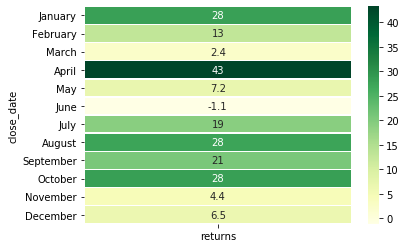

In [34]:
monthly_returns = trades.groupby(trades['close_date'].dt.strftime('%B'))['returns'].sum().sort_values()
monthly_returns = monthly_returns.to_frame()
cats = ['January', 'February', 'March', 'April', 'May', 'June', "July", 'August', 'September', 'October', 'November', 'December']
monthly_returns = monthly_returns.reindex(cats, axis=0)

sns.heatmap(monthly_returns, cmap='YlGn', linewidths=0.5, annot=True);

### Equity Curve and Drawdown

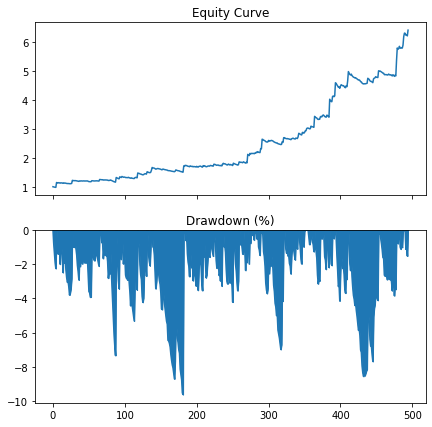

In [35]:
fig, ax = plt.subplots(2, 1, figsize = (7, 7), sharex=True)
eq = trades['equity_curve']
dd = trades['drawdown']
ax[0].plot(eq)
ax[0].set_title('Equity Curve')
dd.plot(ax=ax[1], kind='area')
ax[1].set_title('Drawdown (%)')

plt.show()

At the end of our backtest, we made over **600%** of our starting equity with maximum drawdown of **9.61%**

### Exploratory Analysis on Trades Data

First, I need to exclude few columns of trades data and leave it only with features and target variable.

In [36]:
# target is returns
# feature is open_range, close_range, initial_momentum and duration
clean_trades = trades[['returns', 'open_range' , 'close_range', 'initial_momentum', 'duration']]
clean_trades.head()

,returns,open_range,close_range,initial_momentum,duration
0,1.338801,0.836798,3.269229,0.006382,74
1,-0.787783,0.735963,1.484853,0.112345,30
2,-0.606208,1.460792,1.597445,0.013055,21
3,-0.536193,1.216090,1.269166,0.044292,122
4,-0.345749,1.336206,2.056133,0.007836,36


In [37]:
clean_trades.describe()

,returns,open_range,close_range,initial_momentum,duration
count,495.000000,495.000000,495.000000,495.000000,495.000000
mean,0.403403,1.051980,2.146811,0.030401,70.351515
std,2.422358,0.316535,1.858251,0.061875,75.804602
min,-1.000000,0.197346,0.256784,-0.072200,1.000000
25%,-0.550060,0.829719,1.143734,0.004578,17.000000
50%,-0.276549,1.080450,1.535991,0.015041,43.000000
75%,0.271318,1.304903,2.566952,0.033988,103.000000
max,18.119187,2.253380,19.077483,0.876529,390.000000


I like to use correlation matrix and pairplot as both of it is some of the fastest way for me to develop an understanding of all my variables. I can also use correlation matrix as **feature selection method**.

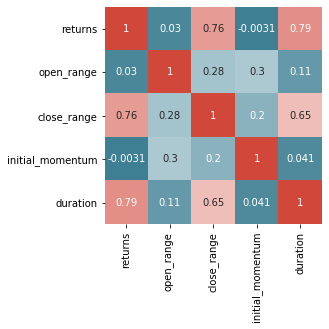

In [38]:
# correlation matrix visualization
sns.heatmap(clean_trades.corr(), cmap=sns.diverging_palette(220, 15, as_cmap=True), annot=True, cbar=False, square=True);

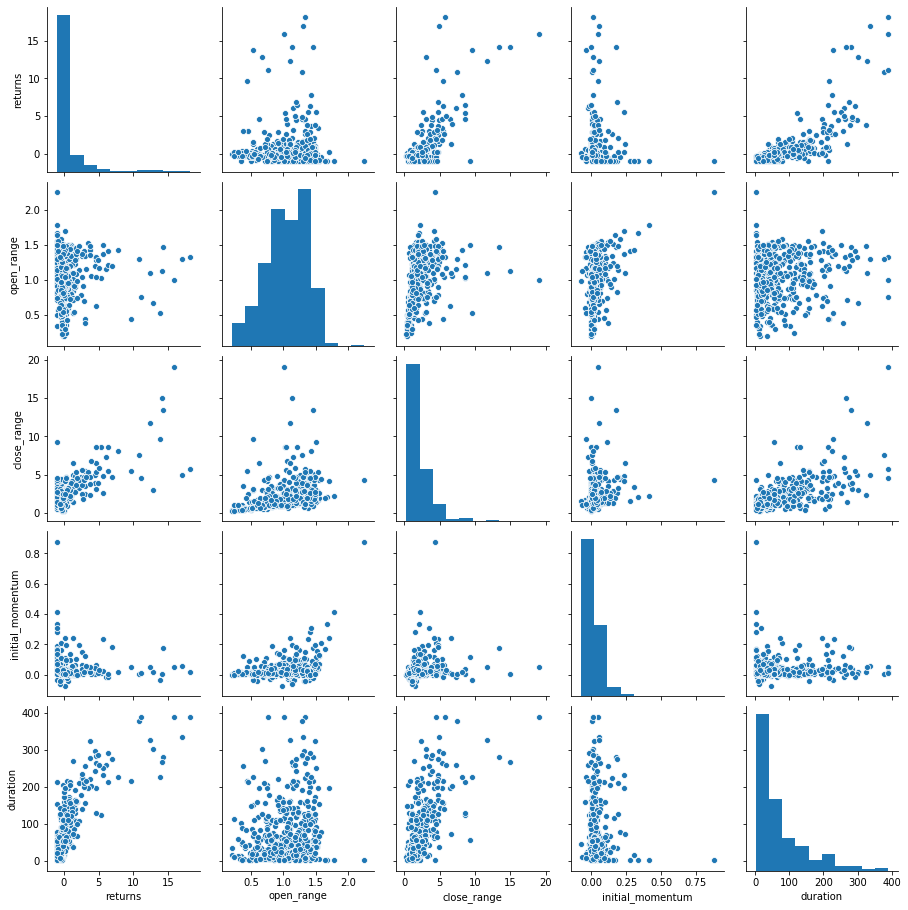

In [39]:
# pairplot visualization
sns.pairplot(clean_trades);

### Feature Engineering

Correlation matrix shows that duration are **highly correlated** with returns. Pairs plot above also indicates a **positive relationship** between duration and returns. We want to affect the value of **returns** by **changing independent variables**, luckily, we can easily fine tune the duration of our trades. Let's take a deeper look into duration, returns and its relationship.

In [40]:
# separating wins and losses to take a deeper look into duration and returns
duration = trades['duration']
wins = returns[returns > 0]
losses = returns[returns < 0]
wins_duration = duration[returns > 0]
losses_duration = duration[returns < 0]

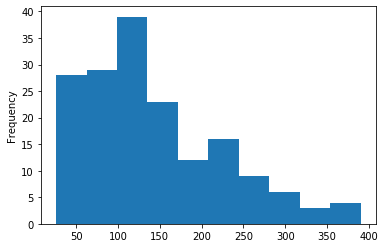

In [41]:
# wins trade duration histogram plot
wins_duration.plot(kind='hist');

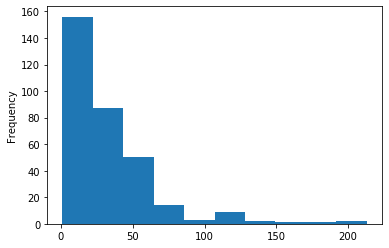

In [42]:
# losses trade duration histogram plot
losses_duration.plot(kind='hist');

In [43]:
print('Average win trades duration : %s' % wins_duration.mean())
print('Average lose trades duration : %s' % losses_duration.mean())

Average win trades duration : 143.12426035502958
Average lose trades duration : 32.33846153846154


Histogram plot of both winning and losing trades duration shows its distribution. The frequency of low duration on losing trades is highly present.

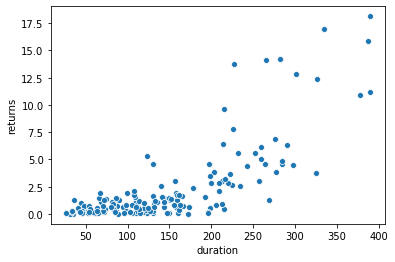

In [44]:
# win returns against duration
sns.scatterplot(x=wins_duration, y=wins);

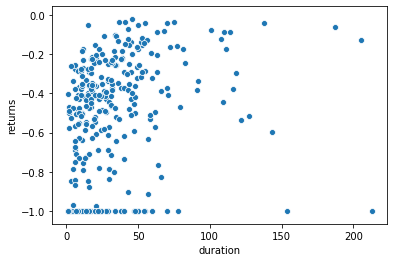

In [45]:
# lose returns against duration
sns.scatterplot(x=losses_duration, y=losses);

We can see positive relationship between winning trades and the duration it takes, but weak to no relationship on losing trades. We will use regression analysis to describe the relationships between **winning trades** and its **duration**.

## Data Modeling - Simple Linear Regression using Scikit-learn

In [46]:
X = wins_duration.values.reshape(-1, 1) # independent variable
y = wins.values.reshape(-1, 1) # dependent variable

# splitting train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

# training the model
model = LinearRegression()
result = model.fit(X_train, y_train)

# predicting y value
y_pred = model.predict(X_test)

# metrics
r2 = metrics.r2_score(y_test, y_pred)

In [47]:
print('Coefficient : %s' % model.coef_)
print('Intercept : %s' % model.intercept_)
print('R-squared  : %s' % r2)

Coefficient : [[0.03229037]]
Intercept : [-2.37454]
R-squared  : 0.6174134779059495


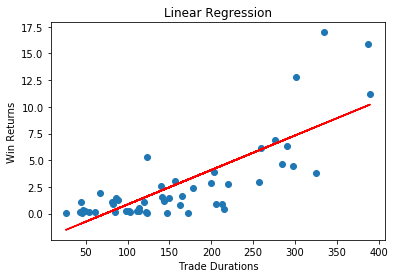

In [48]:
# linear regression plot
plt.scatter(X_test, y_test)
plt.plot(X_test, y_pred, color='red')
plt.xlabel('Trade Durations')
plt.ylabel('Win Returns')
plt.title('Linear Regression')
plt.show();

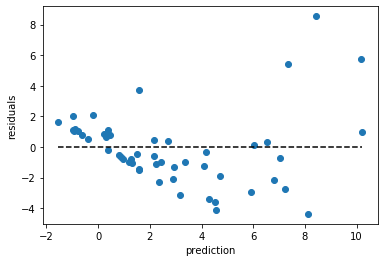

In [49]:
# residual plot
residuals = y_test - y_pred
plt.scatter(x=y_pred, y=residuals)
plt.hlines(y=0, xmin=min(y_pred), xmax=max(y_pred), linestyle='dashed')
plt.ylabel('residuals')
plt.xlabel('prediction')
plt.show();

From our observation, more than 61% of the variance in our data is being explained by the model.

## Algorithm Tuning

We've seen the observation result from our model. Let's tune and modify the algorithm to make it easier to evaluate. As a trader, we should have our favorable max drawdown in mind, we don't want to let the maximum drawdown went way too far as it's possible that it will affect us psychologically, so we will **limit the maximum drawdown** to 10% of account.

In [50]:
# modified trades function, adding summary
def get_trades_summary(min_duration, simulation_data):
    # context
    position = 0
    stop_loss = -1

    # data for our model
    side = []
    durations = []
    open_date = []
    close_date = []
    open_range = [] # open range is range width at trade entry
    close_range = [] # close range is range width at trade exit
    returns = [] # returns is the percent difference of price between entry and exit
    initial_momentum = [] # initial momentum is range width when momentum shift happen subtracted by compressed range width

    for index, rows in simulation_data.iterrows():
        if (position == 0):
            if (simulation_data.loc[index, 'signal'] == 1):
                position = 1
                bp = simulation_data.loc[index+1, 'open']
                oi = index
                open_date.append(simulation_data.loc[index+1, 'timestamp'])
                open_range.append(simulation_data.loc[index, 'range_width'])
                initial_momentum.append(simulation_data.loc[index, 'range_width']-simulation_data.loc[index-1, 'range_width'])
                side.append(position)
            elif (simulation_data.loc[index, 'signal'] == -1):
                position = -1
                sp = simulation_data.loc[index+1, 'open']
                oi = index
                open_date.append(simulation_data.loc[index+1, 'timestamp'])
                open_range.append(simulation_data.loc[index, 'range_width'])
                initial_momentum.append(simulation_data.loc[index, 'range_width']-simulation_data.loc[index-1, 'range_width'])
                side.append(position)
        elif (position == 1):
            if ((simulation_data.loc[index+1, 'low']-bp)/bp*100 <= stop_loss):
                position = 0
                duration = index - oi
                returns.append(stop_loss)
                close_date.append(simulation_data.loc[index, 'timestamp'])
                close_range.append(simulation_data.loc[index, 'range_width'])
                durations.append(duration)
            elif (simulation_data.loc[index, 'close'] <= simulation_data.loc[index, 'upper_middle']) and (index-oi > min_duration):
                position = 0
                duration = index - oi
                sp = simulation_data.loc[index, 'close']
                pc = ((sp-bp)/bp)*100
                returns.append(pc)
                close_date.append(simulation_data.loc[index, 'timestamp'])
                close_range.append(simulation_data.loc[index, 'range_width'])
                durations.append(duration)
        elif (position == -1):
            if ((sp-simulation_data.loc[index, 'high'])/sp*100 <= stop_loss):
                position = 0
                duration = index - oi
                returns.append(stop_loss)
                close_date.append(simulation_data.loc[index, 'timestamp'])
                close_range.append(simulation_data.loc[index, 'range_width'])
                durations.append(duration)
            elif (simulation_data.loc[index, 'close'] >= simulation_data.loc[index, 'lower_middle']) and (index-oi > min_duration):
                position = 0
                duration = index - oi
                bp = simulation_data.loc[index, 'close']
                pc = ((sp-bp)/sp)*100
                returns.append(pc)
                close_date.append(simulation_data.loc[index, 'timestamp'])
                close_range.append(simulation_data.loc[index, 'range_width'])
                durations.append(duration)

    trades = pd.DataFrame({'open_date':open_date, 
                       'close_date':close_date,
                       'duration':durations,
                       'open_range':open_range, 
                       'close_range':close_range, 
                       'initial_momentum':initial_momentum,
                       'side':side,
                       'returns':returns})
    
    summary = pd.DataFrame({'min_duration': min_duration,
                           'final_equity': get_final_equity(get_equity_curve(trades['returns'])),
                           'max_drawdown': get_max_drawdown(get_equity_curve(trades['returns']))}, index = [0])
    
    return trades, summary

In [51]:
# generating improved trades summary

improved_trades = pd.DataFrame()
min_duration = 1 # set minimum trade duration to 1
max_drawdown = 9.61 # set initial max drawdown from our unimproved algorithm
while max_drawdown < 10: # set the max drawdown to 10.2 to get more improved trades data for our final analysis
    _, summary = get_trades_summary(min_duration, simulation_data)
    improved_trades = improved_trades.append(summary)
    max_drawdown = summary['max_drawdown'][0]
    min_duration += 1

In [52]:
# resetting index
improved_trades = improved_trades.reset_index(drop=True)

In [53]:
improved_trades.describe()

,min_duration,final_equity,max_drawdown
count,38.000000,38.000000,38.000000
mean,19.500000,6.943348,9.098421
std,11.113055,0.673320,0.421776
min,1.000000,6.378489,8.230000
25%,10.250000,6.473623,8.820000
50%,19.500000,6.694908,9.135000
75%,28.750000,7.363495,9.432500
max,38.000000,8.752682,10.030000


In [54]:
improved_trades.tail(5)

,min_duration,final_equity,max_drawdown
33,34,7.818454,9.51
34,35,7.952718,9.41
35,36,8.353817,9.37
36,37,8.752682,9.44
37,38,8.638576,10.03


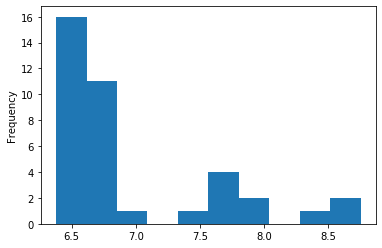

In [55]:
# final equity histogram plot
improved_trades['final_equity'].plot(kind='hist');

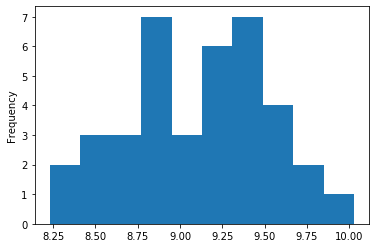

In [56]:
# max drawdown histogram plot
improved_trades['max_drawdown'].plot(kind='hist');

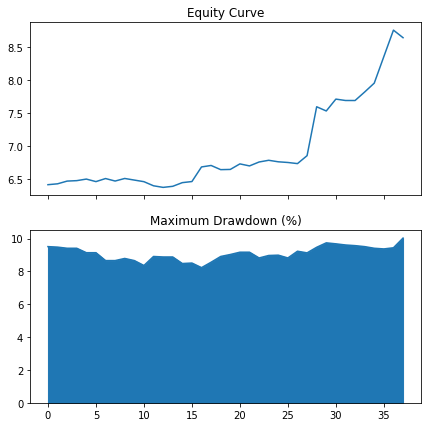

In [57]:
# final equity and max drawdown plot
fig, ax = plt.subplots(2, 1, figsize = (7, 7), sharex=True)
fe = improved_trades['final_equity']
md = improved_trades['max_drawdown']
ax[0].plot(fe)
ax[0].set_title('Equity Curve')
md.plot(ax=ax[1], kind='area')
ax[1].set_title('Maximum Drawdown (%)')

plt.show()

Using 37 bars as minimum duration for our trade has been proven to increase our final equity from 641% to 875% in the span of approximately 2 years, with maximum drawdown of 9.44%

## Benchmarking

Backtesting is only part of evaluating the efficacy of a trading strategy. We would like to compare it to other available strategies and/or assets in order to determine how well we have done. People in Indonesia usually assume that it's great to own gold as an investment, we will benchmark our momentum algorithm trading for ETHUSD against **buy and hold** strategy for XAU/IDR, it is a ticker of gold(per oz) against Indonesian rupiah. We will only use 2019 data of both trades.

In [58]:
# loading xauidr data from csv file
xauidr = pd.read_csv('xauidr_2019.csv', parse_dates=True)
xauidr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 259 entries, 0 to 258
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Tanggal     259 non-null    object
 1   Terakhir    259 non-null    object
 2   Pembukaan   259 non-null    object
 3   Tertinggi   259 non-null    object
 4   Terendah    259 non-null    object
 5   Perubahan%  259 non-null    object
dtypes: object(6)
memory usage: 12.3+ KB


In [59]:
xauidr.head()

,Tanggal,Terakhir,Pembukaan,Tertinggi,Terendah,Perubahan%
0,31/12/2019,"210.560,98","210.976,38","212.820,39","210.540,61","-0,16%"
1,30/12/2019,"210.892,88","210.895,42","211.359,22","210.319,84","0,13%"
2,27/12/2019,"210.627,61","210.884,48","211.408,38","210.266,22","-0,07%"
3,26/12/2019,"210.771,95","209.430,81","211.107,42","209.185,22","0,75%"
4,25/12/2019,"209.204,56","209.491,58","209.502,06","209.418,98","-0,01%"


In [60]:
# xauidr data cleaning
xauidr['Tanggal'] = pd.to_datetime(xauidr['Tanggal'])
xauidr.sort_values(by=['Tanggal'], inplace=True, ascending=True)
xauidr.reset_index(drop=True, inplace=True)
xauidr = xauidr.rename(columns={'Tanggal':'date','Terakhir':'close','Tertinggi':'high','Terendah':'low','Pembukaan':'open', 'Perubahan%':'returns'})

# removing % 
start, stop, step = 0, -1, 1
xauidr['returns'] = xauidr['returns'].astype(str)
xauidr['returns'] = xauidr['returns'].str.slice(start, stop, step)

# replacing (,) with (.)
xauidr['returns'] = (xauidr['returns'].replace(',', '.', regex=True))
xauidr['returns'] = xauidr['returns'].astype(float)

In [61]:
# generating equity curve column and values
xauidr['equity_curve'] = get_equity_curve(xauidr['returns'])
xauidr.head()

,date,close,open,high,low,returns,equity_curve
0,2019-01-02,"183.653,56","184.579,53","184.726,23","183.442,75",-0.51,0.994900
1,2019-01-03,"182.487,84","184.715,66","185.671,17","182.117,92",-1.16,0.983359
2,2019-01-04,"183.072,56","183.906,78","184.531,56","183.024,56",-0.45,0.978934
3,2019-01-05,"181.822,47","182.912,31","183.451,33","181.425,31",-0.54,0.973648
4,2019-01-07,"195.290,17","196.772,06","197.459,38","195.046,66",-1.89,0.955246


In [62]:
# generating trades with 37 bars minimum duration
trades_37, _ = get_trades_summary(37, simulation_data)

In [63]:
# generating equity curve column and values
trades_37['equity_curve'] = get_equity_curve(trades_37['returns'])

In [64]:
# filtering trades, only trades from 2019 remain
start_date = '2019-01-01'
end_date = '2019-12-31'
mask = (trades_37['open_date'] > start_date) & (trades_37['close_date'] <= end_date)
trades_37_2019 = trades_37.loc[mask]
trades_37_2019 = trades_37_2019.reset_index(drop=True)
trades_37_2019 = trades_37_2019[['close_date', 'equity_curve']]

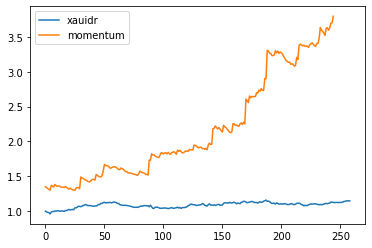

In [65]:
# plotting xauidr equity curve vs momentum(trades_37_2019)
ax_bench = (xauidr['equity_curve']).plot(label = "xauidr")
ax_bench = (trades_37_2019['equity_curve']).plot(ax = ax_bench, label = "momentum")
ax_bench.legend(ax_bench.get_lines(), [l.get_label() for l in ax_bench.get_lines()], loc = 'best')
ax_bench;

In [66]:
print('XAUIDR buy/hold final equity : %s' % get_final_equity(xauidr['equity_curve']))
print('ETHUSD momentum algorithm final equity : %s' % get_final_equity(trades_37_2019['equity_curve']))

XAUIDR buy/hold final equity : 1.142304476134078
ETHUSD momentum algorithm final equity : 3.799601327720107


Our momentum algorithm outperform buying and holding gold by more than 200%

## Conclusion

We have trade duration as our best feature that we can fine tune to improve our algorithm profitability. Does backtesting predict future performance? **Not at all**. Backtesting likely overfit, just because backtesting provide high growth doesn't mean that growth will hold in the future. We need to forward test, or make an out of sample test to determine if our strategy is actually robust, but outperforming a benchmark assets and/or strategy by multiple orders is not bad at all!